# Test Cricket Predictor

## Setup

In [1]:
import numpy as np
import pandas as pd
pd.set_option('mode.chained_assignment', None)
import datetime
import re
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
from plotly.offline import iplot, init_notebook_mode
init_notebook_mode()
from bs4 import BeautifulSoup
from urllib.request import urlopen
from IPython.display import Image
from IPython.core.display import HTML 
import glob
import re
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
import pickle

def logit(p):
    return np.log(p / (1 - p))

def logistic(y):
    return  1 / (np.exp(-y) + 1)

def get_soup(url):
    """Imports URL as beautifulsoup object
    """
    try:
        page = urlopen(url)
        html = page.read().decode("utf-8")
        soup = BeautifulSoup(html, "lxml")# "html.parser")
        return soup
    except:
        return None

def read_and_combine(file_pattern):
    """Reads CSVs with common file_pattern and concatenates them into a Pandas dataframe"""
    all_files = glob.glob(file_pattern)

    li = []

    for filename in all_files:
        _ = pd.read_csv(filename, index_col=None, header=0)
        li.append(_)

    return pd.concat(li, axis=0, ignore_index=True)

# Team abbreviation dictionary
team_dict = {
    'Afghanistan': 'AFG',
    'Australia': 'AUS',
    'Bangladesh': 'BDESH',
    'England': 'ENG',
    'India': 'INDIA',
    'Ireland': 'IRE',
    'New Zealand': 'NZ',
    'Pakistan': 'PAK',
    'South Africa': 'SA',
    'Sri Lanka': 'SL',
    'West Indies': 'WI',
    'Zimbabwe': 'ZIM',
    'ICC World XI': 'ICC'
}

C:\Users\user\Anaconda3\lib\site-packages\statsmodels\tools\_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


## Data scrape

In [2]:
# Fall of wicket (FOW) data

# https://stats.espncricinfo.com/ci/engine/stats/index.html?class=1;filter=advanced;orderby=start;page=1;size=200;template=results;type=fow;view=innings
num_pages = 383

# for page in range(1, num_pages+1):
#     print(page, end=' ')
    
#     teams = []
#     wickets = []
#     runs = []
#     innings = []
#     opponents = []
#     venues = []
#     start_dates = []
    
#     soup = get_soup(f'https://stats.espncricinfo.com/ci/engine/stats/index.html?class=1;filter=advanced;orderby=start;page={page};size=200;template=results;type=fow;view=innings')

#     for s in soup.findAll('tbody')[0].findAll('tr'):
#         teams.append(s.findAll('td')[0].contents[3])
#         wickets.append(s.findAll('td')[1].string)
#         runs.append(s.findAll('td')[2].string)
#         innings.append(s.findAll('td')[5].string)
#         opponents.append(s.findAll('td')[7].contents[1].string)
#         venues.append(s.findAll('td')[8].string)
#         start_dates.append(s.findAll('td')[9].string)
        
#     tmp = pd.DataFrame(zip(teams, wickets, runs, innings, opponents, venues, start_dates), 
#                        columns=['team','wicket', 'runs', 'innings', 'opponent', 'venue', 'start_date'])
#     tmp.to_csv(f'data/fow_{page}.csv', index=False)

In [3]:
# Result data

# https://stats.espncricinfo.com/ci/engine/stats/index.html?class=1;filter=advanced;orderby=start;page=1;size=200;template=results;type=team;view=results
num_pages = 25

# for page in range(1, num_pages+1):
#     print(page, end=' ')
    
#     teams = []
#     results = []
#     toss = []
#     opponents = []
#     venues = []
#     start_dates = []
    
#     soup = get_soup(f'https://stats.espncricinfo.com/ci/engine/stats/index.html?class=1;filter=advanced;orderby=start;page={page};size=200;template=results;type=team;view=results')

#     for s in soup.findAll('tbody')[0].findAll('tr'):
#         teams.append(s.findAll('td')[0].string)
#         results.append(s.findAll('td')[1].string)
#         toss.append(s.findAll('td')[3].string)
#         opponents.append(s.findAll('td')[6].contents[1].string)
#         venues.append(s.findAll('td')[7].string)
#         start_dates.append(s.findAll('td')[8].string)
        
#     tmp = pd.DataFrame(zip(teams, results, toss, opponents, venues, start_dates), 
#                        columns=['team', 'result', 'toss', 'opponent', 'venue', 'start_date'])
#     tmp.to_csv(f'data/results_{page}.csv', index=False)

## Data cleaning

In [4]:
# Fall of Wicket dataset

# Import
fow = read_and_combine('data/fow*.csv')

# Clean
fow['team'] = fow['team'].str.extract('(\w+)')
fow['opponent'] = fow['opponent'].apply(lambda x: team_dict[x] if x in team_dict else x)
fow['is_unbroken'] = np.where(fow['runs'].str.contains('\*', regex=True), 1, 0)
fow['runs'] = fow['runs'].astype(str).map(lambda x: re.sub(r'\W+', '', x)).astype(int)
fow['start_date'] = pd.to_datetime(fow['start_date'], infer_datetime_format=True)

# Combine retired hurts
fow = fow.groupby(['start_date', 'team', 'opponent', 'venue', 'innings', 'wicket']).agg({'runs': 'sum', 'is_unbroken': 'min'}).reset_index()

# Calculate team runs at FOW
fow['runs_fow'] = fow.sort_values(by=['start_date', 'team', 'opponent', 'venue', 'innings', 'wicket']).groupby(['start_date', 'team', 'innings'])[['runs']].cumsum()
fow = fow.reset_index()

# Results dataset

# Import
results = read_and_combine('data/results*.csv')

# Clean
results['team'] = results['team'].apply(lambda x: team_dict[x] if x in team_dict else x)
results['opponent'] = results['opponent'].apply(lambda x: team_dict[x] if x in team_dict else x)
results['start_date'] = pd.to_datetime(results['start_date'], infer_datetime_format=True)

# Merge together
key_vars = ['start_date', 'team', 'opponent', 'venue']
result_vars = ['result', 'toss']
fow.drop(columns=result_vars + ['index'], inplace=True, errors='ignore')
fow = fow.merge(results[key_vars + result_vars],
         on=key_vars,
         how='left')

# Cumulative team runs
team_runs = fow.sort_values(by=key_vars + ['innings']).groupby(key_vars + ['innings'])[['runs']].sum()
team_runs['cum_runs'] = team_runs.groupby(key_vars)[['runs']].cumsum()
team_runs = team_runs.reset_index()
team_runs.rename(columns={'innings': 'cum_innings'}, inplace=True)

fow2 = fow.merge(team_runs[key_vars + ['cum_innings', 'cum_runs']], 
                 left_on=key_vars,
                 right_on=key_vars)

fow3 = fow2.loc[(fow2['innings'] > fow2['cum_innings'])]
fow3['rank'] = fow3.groupby(key_vars + ['innings', 'wicket'])[['cum_innings']].rank(ascending=False)
fow3 = fow3.loc[fow3['rank'] == 1]
fow3.drop(columns=['cum_innings', 'rank'], inplace=True)
fow3.rename(columns={'cum_runs': 'team_cum_runs'}, inplace=True)

# New fow dataset
fow = pd.concat([fow.loc[fow['innings'] <= 2], fow3]).fillna(0)

# Cumulative opponent runs
opp_runs = team_runs.copy()
opp_runs.rename(columns={'innings': 'cum_innings', 'team': 'opponent', 'opponent': 'team'}, inplace=True)

fow2 = fow.merge(opp_runs[key_vars + ['cum_innings', 'cum_runs']], 
                 on=key_vars)

fow3 = fow2.loc[(fow2['innings'] > fow2['cum_innings'])]
fow3['rank'] = fow3.groupby(['start_date', 'opponent', 'team', 'venue'] + ['innings', 'wicket'])[['cum_innings']].rank(ascending=False)
fow3 = fow3.loc[fow3['rank'] == 1]
fow3.drop(columns=['cum_innings', 'rank'], inplace=True)
fow3.rename(columns={'cum_runs': 'opp_cum_runs'}, inplace=True)

# New fow dataset
fow = pd.concat([fow.loc[fow['innings'] == 1], fow3]).fillna(0).sort_values(key_vars + ['innings', 'wicket'])

# Calculate run difference between teams
fow['runs_diff'] = fow['team_cum_runs'] - fow['opp_cum_runs'] + fow['runs_fow']
fow['wicket_start'] = fow['wicket'] - 1
fow['runs_diff_start'] = fow['runs_diff'] - fow['runs']

# Win indicator
fow['won_match'] = np.where(fow['result'] == 'won', 1, 0)

## Fit model

In [5]:
# Create model dataset
# https://stats.espncricinfo.com/ci/engine/stats/index.html?class=1;filter=advanced;groupby=decade;orderby=start;template=results;type=batting
model_start_date = datetime.datetime(1919,1,1)
model_end_date = datetime.datetime(2020,12,26)

# Restrict to relevant rows
fow_model = fow.loc[(fow['result'].isin(['won', 'lost'])) & (fow['start_date'] >= model_start_date) & (fow['start_date'] <= model_end_date)]

# Create base data set
innings = pd.DataFrame(range(1,5), columns=['innings'])
innings['key'] = True
wickets = pd.DataFrame(range(10), columns=['wickets'])
wickets['key'] = True
runs_diff = pd.DataFrame(range(-1000,1001), columns=['runs_diff'])
runs_diff['key'] = True
df = innings.merge(wickets, on='key').merge(runs_diff, on='key')
df.drop(columns=['key'], inplace=True)

# Remove instances never seen
df = df.loc[~((df['innings'] == 1) & (df['runs_diff'] < fow_model[fow_model['innings'] == 1]['runs_diff'].min())) &
                  ~((df['innings'] == 1) & (df['runs_diff'] > fow_model[fow_model['innings'] == 1]['runs_diff'].max())) &
                 ~((df['innings'] == 2) & (df['runs_diff'] < fow_model[fow_model['innings'] == 2]['runs_diff'].min())) &
                 ~((df['innings'] == 2) & (df['runs_diff'] > fow_model[fow_model['innings'] == 2]['runs_diff'].max())) &
                 ~((df['innings'] == 3) & (df['runs_diff'] < fow_model[fow_model['innings'] == 3]['runs_diff'].min())) &
                 ~((df['innings'] == 3) & (df['runs_diff'] > fow_model[fow_model['innings'] == 3]['runs_diff'].max())) &
                 ~((df['innings'] == 4) & (df['runs_diff'] < fow_model[fow_model['innings'] == 4]['runs_diff'].min())) &
                 ~((df['innings'] == 4) & (df['runs_diff'] > fow_model[fow_model['innings'] == 4]['runs_diff'].max()))]

# Inefficient way to count instances of wickets/runs
def count_instances(row, df):
    """Counts the instances of of the number of wickets and runs in the model dataset df, based on the values of row
    """
    instances = df[(df['innings'] == row['innings']) & (df['wicket_start'] == row['wickets']) & (df['runs_diff_start'] <= row['runs_diff'])  & (df['runs_diff'] >= row['runs_diff'])]
    return instances.shape[0], instances['won_match'].sum()
    
# Calculate win count and %
df['instances'] = df.apply(lambda row: count_instances(row, fow_model), axis=1)
df = df[~df['instances'].isnull()]
df['innings_count'] = df['instances'].apply(lambda x: x[0])
df['win_count'] = df['instances'].apply(lambda x: x[1])
df['win_pct'] = df['win_count'] / df['innings_count']
df.drop(columns=['instances'], inplace=True)
df = df[df['innings_count'] > 0]

In [6]:
# Plot it
px.line(df, x='runs_diff', y='win_pct', color='wickets', facet_col='innings', facet_col_wrap=2)

0.9902304611486735
(-667, 507)


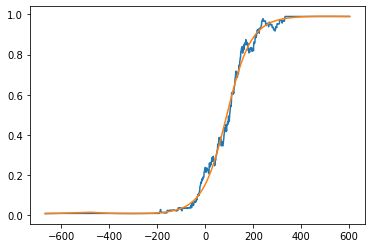

In [7]:
# Sandpit
innings = 3
wickets = 3
poly_order = 5
test_size = 0.2
p_min = 0.01
p_max = 0.99

df_inns_wkt = df.loc[(df['innings'] == innings) & (df['wickets'] == wickets)]
X = df_inns_wkt[['runs_diff']]
p = df_inns_wkt['win_pct']
sample_weight = df_inns_wkt['innings_count']
p[p < p_min] = p_min
p[p > p_max] = p_max
y = logit(p)

for degree in range(1, poly_order+1):
    X[f'runs_diff_{degree}'] = X['runs_diff'] ** degree

# model 
X_train, X_test, p_train, p_test, y_train, y_test, w_train, w_test = train_test_split(X, p, y, sample_weight, test_size=test_size, random_state=42)
clf = LinearRegression()
clf.fit(X_train, y_train, w_train)
preds = clf.predict(X)
domain = (X.reset_index().loc[preds.argmin(), 'runs_diff'],
          X.reset_index().loc[preds.argmax(), 'runs_diff'])
p_model = logistic(preds)

print(clf.score(X_test, y_test, w_test))
print(domain)
plt.plot(np.array(X['runs_diff']), np.array(p))
plt.plot(np.array(X['runs_diff']), np.array(p_model))

In [8]:
# Fit model

# Model parameters
poly_order = 5
p_min = 0.01
p_max = 0.99

# Initalize model data frame
model = pd.DataFrame(columns=['innings', 'wickets', 'regression', 'domain', 'accuracy'])

for innings in df['innings'].unique():
    for wickets in df['wickets'].unique():
        
        df_inns_wkt = df.loc[(df['innings'] == innings) & (df['wickets'] == wickets)]
        
        # Features
        X = df_inns_wkt[['runs_diff']]
        
        for degree in range(2, poly_order+1):
            X[f'runs_diff_{degree}'] = X['runs_diff'] ** degree
    
        # Response
        p = df_inns_wkt['win_pct']
        p[p < p_min] = p_min
        p[p > p_max] = p_max
        y = logit(p)
        
        # Weight
        sample_weight = df_inns_wkt['innings_count']
        
        # Model
        clf = LinearRegression()
        clf.fit(X, y, sample_weight)
        
        # Domain
        preds = clf.predict(X)
        domain = (X.reset_index().loc[preds.argmin(), 'runs_diff'],
                  X.reset_index().loc[preds.argmax(), 'runs_diff'])
        
        # Add to data frame
        model = model.append({'innings': innings,
                             'wickets': wickets,
                             'regression': clf,
                              'domain': domain,
                             'accuracy': clf.score(X, y, sample_weight)}, ignore_index=True) # accuracy on train data

In [9]:
# with open('model.pkl', 'wb') as f:
#    pickle.dump(model, f)

# with open('model.pkl', 'rb') as f:
#    model = pickle.load(f)

In [10]:
def predict_monotonic(clf, runs_diff, domain, poly_order):
    """Predicts classifier at given point runs_diff, ensuring it is monotonic
    """
    rd = np.max([np.min([runs_diff, domain[1]]), domain[0]])
    
    li = []
    for degree in range(1, poly_order + 1):
        li.append(rd**degree)
        
    X = np.array(li).reshape(1,-1)
    pred = clf.predict(X)
    
    pred = pred + np.min([runs_diff - domain[0], 0]) * 0.01 + np.max([runs_diff - domain[1], 0]) * 0.01
    return logistic(pred)
        
# Merge model onto base dataframe
df.drop(columns=['regression', 'domain'], inplace=True, errors='ignore')
df = df.merge(model[['innings', 'wickets', 'regression', 'domain']], on=['innings', 'wickets'])

# Predict at each state
df['pred_win_pct_raw'] = df.apply(lambda row: predict_monotonic(row['regression'],
                                                             row['runs_diff'],
                                                             row['domain'],
                                                               poly_order), axis=1).apply(lambda x: x[0])

# Smooth predictions
df['pred_win_pct'] = df.sort_values(by=['innings', 'wickets', 'runs_diff']).groupby(['innings', 'wickets'])[['pred_win_pct_raw']].cummax()
df['pred_win_pct'] = df.sort_values(by=['innings', 'wickets', 'runs_diff']).groupby(['innings', 'runs_diff'])[['pred_win_pct']].cummin()
df['error'] = df['pred_win_pct'] - df['win_pct']
df['smoothing_error'] = df['pred_win_pct'] - df['pred_win_pct_raw']

# with open('model.pkl', 'wb') as f:
#    pickle.dump(df.loc[:, ['innings', 'wickets', 'runs_diff', 'pred_win_pct']], f)

In [11]:
# Check
df.sort_values(by='smoothing_error', ascending=False).head()

,innings,wickets,runs_diff,innings_count,win_count,win_pct,regression,domain,pred_win_pct_raw,pred_win_pct,error,smoothing_error
21885,3,4,-79,74,0,0.0,LinearRegression(),"(-661, 466)",0.020730,0.046240,0.046240,0.025510
21886,3,4,-78,77,0,0.0,LinearRegression(),"(-661, 466)",0.021021,0.046468,0.046468,0.025447
21887,3,4,-77,76,0,0.0,LinearRegression(),"(-661, 466)",0.021318,0.046468,0.046468,0.025150
21884,3,4,-80,77,0,0.0,LinearRegression(),"(-661, 466)",0.020445,0.045588,0.045588,0.025144
21888,3,4,-76,74,0,0.0,LinearRegression(),"(-661, 466)",0.021621,0.046468,0.046468,0.024847


In [12]:
# Check
df.sort_values(by='error', ascending=False).tail()

,innings,wickets,runs_diff,innings_count,win_count,win_pct,regression,domain,pred_win_pct_raw,pred_win_pct,error,smoothing_error
3607,1,6,42,8,4,0.5,LinearRegression(),"(18, 876)",0.166664,0.166664,-0.333336,0.0
3606,1,6,41,6,3,0.5,LinearRegression(),"(18, 876)",0.164208,0.164208,-0.335792,0.0
3605,1,6,40,6,3,0.5,LinearRegression(),"(18, 876)",0.161751,0.161751,-0.338249,0.0
3604,1,6,39,6,3,0.5,LinearRegression(),"(18, 876)",0.159294,0.159294,-0.340706,0.0
4391,1,7,52,6,3,0.5,LinearRegression(),"(21, 903)",0.109657,0.109657,-0.390343,0.0


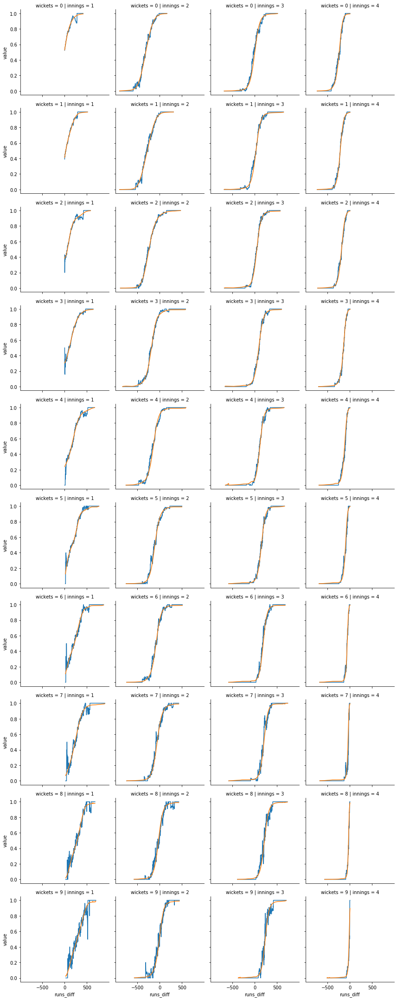

In [13]:
# Show actual vs expected
df_melt = pd.melt(df.loc[:, ['innings', 'wickets', 'runs_diff', 'win_pct', 'pred_win_pct']], ['innings', 'wickets', 'runs_diff'])
g = sns.FacetGrid(df_melt, col='innings', row='wickets', hue='variable')
g.map(sns.lineplot, 'runs_diff', 'value')

In [14]:
# Plot it
import plotly
df2 = df.copy()
df2['Runs difference vs opponent'] = df2['runs_diff']
df2['Actual % of wins'] = df2['win_pct']
df2['Predicted % of wins'] = df2['pred_win_pct']
df2['Wickets lost'] = df2['wickets']
df2['Innings'] = df2['innings']
for var in ['Actual % of wins', 'Predicted % of wins']:
    fig = px.line(df2, x='Runs difference vs opponent', y=var, color='Wickets lost', facet_col='Innings', facet_col_wrap=2)
    fig.update_xaxes(matches=None)
    fig.show()
    plotly.offline.plot(fig, filename="C:\\Users\\user\\Documents\\" + var + ".html")